# Vehicle Detection Project

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.



## Preparation

### Load Libraries

In [523]:
import glob
import os
import time
import numpy as np
import cv2

from sklearn import linear_model, datasets
from sklearn.svm import LinearSVC, SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import ShuffleSplit, train_test_split, GridSearchCV
from sklearn.metrics import f1_score, make_scorer, accuracy_score, recall_score
from sklearn.utils import shuffle

from skimage.feature import hog
from scipy.ndimage.measurements import label

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline

### Define Utility Functions - Image Display

In [106]:
def show_images(images, titles, num_col, num_row, figsize, save_fname='', fontsize=50):
    """
    Show images in table format.
    """
    title_flg = False
    if len(images) == len(titles):
        title_flg = True
    
    fig = plt.figure(figsize=figsize)
    cur_place = 1
    for idx, img in enumerate(images):
        cur_subplot = fig.add_subplot(num_row, num_col, cur_place)
        
        if len(img.shape) == 2:
            plt.imshow(img, cmap='gray')
        else:
            plt.imshow(img)
        
        if title_flg:
            cur_subplot.set_title(titles[idx], fontsize=fontsize)
        
        cur_place += 1
    fig.tight_layout()
    if save_fname != '':
        plt.savefig(save_fname)
    plt.show()
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Dataset - Test Image

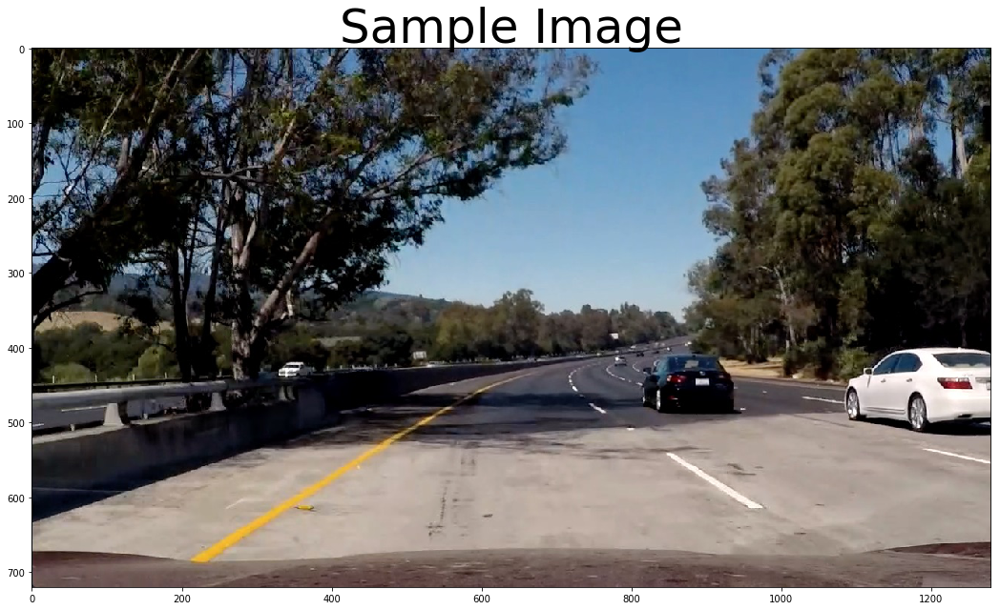

In [516]:
# Load Test Images
sample_img_fnames = glob.glob('./test_images/test?.jpg')
sample_imgs = []
for fname in sample_img_fnames:
    #img = mpimg.imread(fname)
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    sample_imgs.append(img)

# Main Test Image
main_sample_img = sample_imgs[0]

show_images([main_sample_img], ['Sample Image'], 1, 1, (24, 9))

### Define Utility Functions - Image Preprocessing

#### Denoising
See https://docs.opencv.org/3.3.1/d5/d69/tutorial_py_non_local_means.html

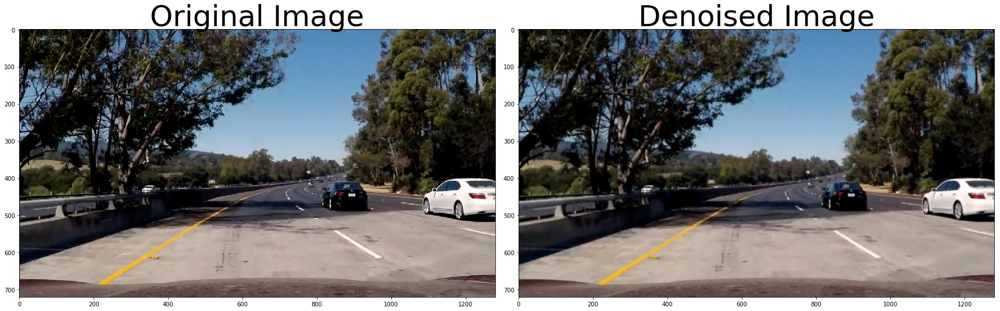

In [344]:
def smooth(img, kernel_size=(5, 5)):
    """
    Smoothing for noise reduction
    """
    #den_h = 10
    #den_temp_window_size = 7
    #den_search_window_size = 21
    #result_img = cv2.fastNlMeansDenoisingColored(img, None, den_h, den_h,
    #                                             den_temp_window_size, den_search_window_size)
    
    return cv2.GaussianBlur(img, kernel_size, 0.0)

den_sample_img = smooth(main_sample_img)
show_images([main_sample_img, den_sample_img], ['Original Image', 'Denoised Image'], 2, 1, (24, 9))

#### Histogram Equalization

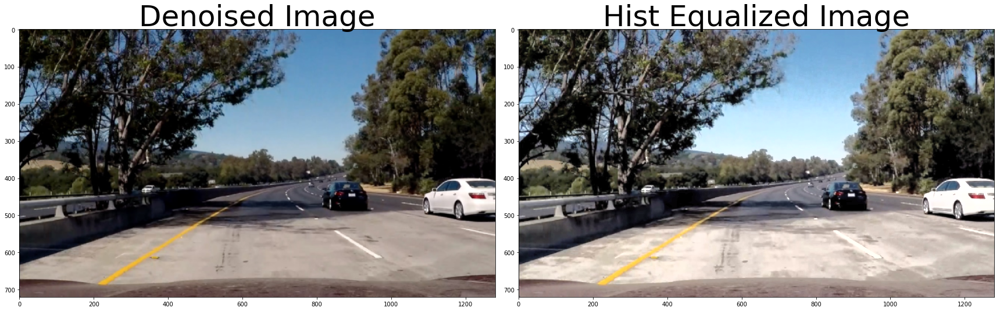

In [345]:
def equalize_hist(img):
    tmp_img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    tmp_img[:,:,0] = cv2.equalizeHist(tmp_img[:,:,0])
    return cv2.cvtColor(tmp_img, cv2.COLOR_YUV2RGB)


eqhist_sample_img = equalize_hist(den_sample_img)
show_images([den_sample_img, eqhist_sample_img], ['Denoised Image', 'Hist Equalized Image'], 2, 1, (24, 9))

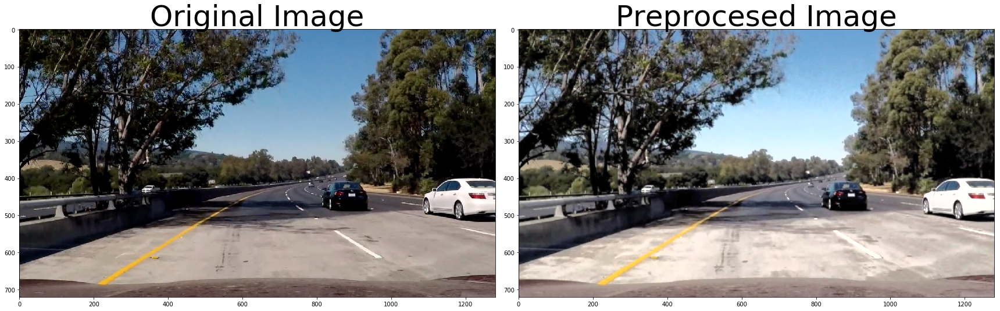

In [482]:
def preprocess(img):
    # Denoising
    smoothed_img = smooth(img)
    # Histogram Equalization
    eqhist_img = equalize_hist(smoothed_img)
    # Normalize
    norm_img = eqhist_img.astype(np.float32) / 255
    
    return norm_img

preproc_sample_img = preprocess(main_sample_img)
show_images([main_sample_img, preproc_sample_img], ['Original Image', 'Preprocesed Image'], 2, 1, (24, 9))

### Dataset - Vehicle and Non-vehicle Images

In [483]:
start_time = time.time()

# Load vehicle images
print('Start loading vehicle images.')
cnt = 0
vehicle_img_fnames = glob.glob('training_images/vehicles/**/*.png')
#vehicle_img_fnames = np.random.choice(vehicle_img_fnames, 100)
vehicle_imgs = []
for fname in vehicle_img_fnames:
    #img = mpimg.imread(fname)
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    img = preprocess(img)
    vehicle_imgs.append(img)
    
    cnt += 1
    if cnt % 500 == 0:
        print('{} / {}'.format(cnt, len(vehicle_img_fnames)))
print('Finish loading vehicle images.')

# Load non vehicle images
print('Start loading non vehicle images.')
cnt = 0
non_vehicle_img_fnames = glob.glob('training_images/non-vehicles/**/*.png')
#non_vehicle_img_fnames = np.random.choice(non_vehicle_img_fnames, 100)
non_vehicle_imgs = []
for fname in non_vehicle_img_fnames:
    #img = mpimg.imread(fname)
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    img = preprocess(img)
    non_vehicle_imgs.append(img)
    
    cnt += 1
    if cnt % 500 == 0:
        print('{} / {}'.format(cnt, len(vehicle_img_fnames)))
print('Finish loading non vehicle images.')

end_time = time.time()
print(round(end_time - start_time, 2), 'Seconds to load training & test images...')

Start loading vehicle images.
500 / 8792
1000 / 8792
1500 / 8792
2000 / 8792
2500 / 8792
3000 / 8792
3500 / 8792
4000 / 8792
4500 / 8792
5000 / 8792
5500 / 8792
6000 / 8792
6500 / 8792
7000 / 8792
7500 / 8792
8000 / 8792
8500 / 8792
Finish loading vehicle images.
Start loading non vehicle images.
500 / 8792
1000 / 8792
1500 / 8792
2000 / 8792
2500 / 8792
3000 / 8792
3500 / 8792
4000 / 8792
4500 / 8792
5000 / 8792
5500 / 8792
6000 / 8792
6500 / 8792
7000 / 8792
7500 / 8792
8000 / 8792
8500 / 8792
Finish loading non vehicle images.
9.93 Seconds to load training & test images...


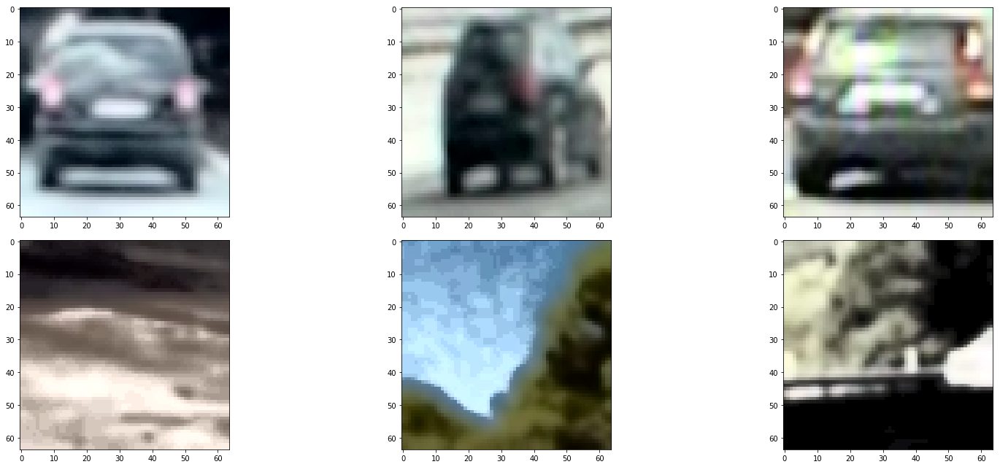

In [484]:
vehicle_non_vehicle_sample_imgs = [
    vehicle_imgs[0], vehicle_imgs[500], vehicle_imgs[1000], 
    non_vehicle_imgs[0], non_vehicle_imgs[500], non_vehicle_imgs[1000]
]

show_images(vehicle_non_vehicle_sample_imgs,
           [], 3, 2, (24, 9), './output_images/car_noncar_image_sample.png')

## Feature Extraction

### HOG

In [485]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if conv == 'RGB2HLS':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    if conv == 'RGB2YUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    if conv == 'RGB2HSV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    if conv == 'YCrCb2HLS':
        return cv2.cvtColor(cv2.cvtColor(img, cv2.COLOR_YCrCb2RGB), cv2.COLOR_RGB2HLS)
    

def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    """
    HOG Feature Calculation
    """
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec, block_norm='L2-Hys')
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec, block_norm='L2-Hys')
        return features

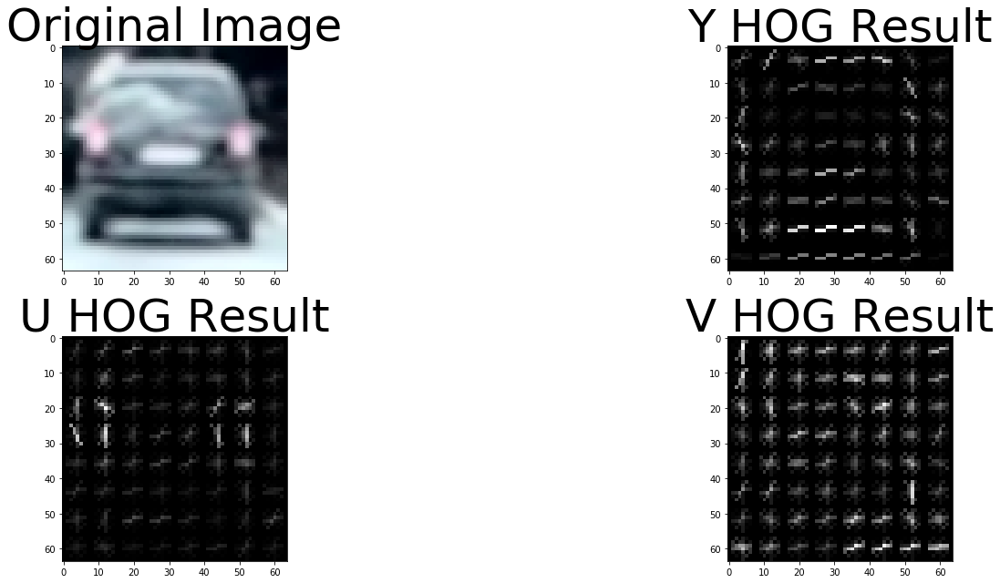

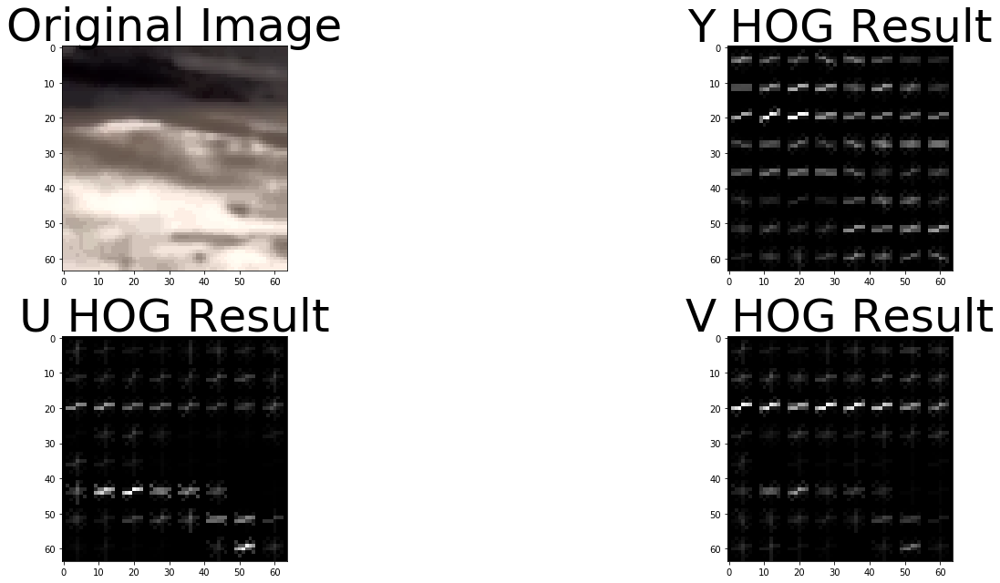

In [613]:
hog_colorspace = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
hog_orient = 9
hog_pix_per_cell = 8
hog_cell_per_block = 2

target_imgs = [vehicle_non_vehicle_sample_imgs[0], vehicle_non_vehicle_sample_imgs[3]]
output_fnames = ['./output_images/hog-vehicle.png', './output_images/hog-non-vehicle.png']
for img, fname in zip(target_imgs, output_fnames):
    hog_features = []
    hog_images = []

    converted_img = convert_color(img, conv='RGB2YCrCb')
    for channel in range(3):
        hog_feature, hog_image = get_hog_features(converted_img[:,:,channel], hog_orient, 
                                            hog_pix_per_cell, hog_cell_per_block, vis=True, feature_vec=True)
        hog_features.append(hog_feature)
        hog_images.append(hog_image)

    hog_features = np.ravel(hog_features)
    
    show_images([img, hog_images[0], hog_images[1], hog_images[2]],
            ['Original Image', 'Y HOG Result', 'U HOG Result', 'V HOG Result'], 
            2, 2, (24, 9), fname)

### Histograms of Color

In [487]:
def color_hist(img, nbins=32, visual_flg=False):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    if visual_flg:
        # Generating bin centers
        bin_edges = channel1_hist[1]
        bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
        return hist_features, bin_centers, (channel1_hist, channel2_hist, channel3_hist)
    else:
        return hist_features

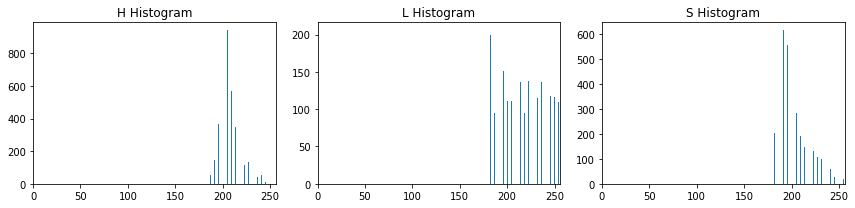

In [488]:
col_hist_features, bin_centers, hist_data = color_hist(
    convert_color(vehicle_non_vehicle_sample_imgs[0], 'RGB2HLS'), 32, True)

fig = plt.figure(figsize=(12,3))
plt.subplot(131)
plt.bar(bin_centers, hist_data[0][0])
plt.xlim(0, 256)
plt.title('H Histogram')
plt.subplot(132)
plt.bar(bin_centers, hist_data[1][0])
plt.xlim(0, 256)
plt.title('L Histogram')
plt.subplot(133)
plt.bar(bin_centers, hist_data[2][0])
plt.xlim(0, 256)
plt.title('S Histogram')
fig.tight_layout()

### Spatial Binning

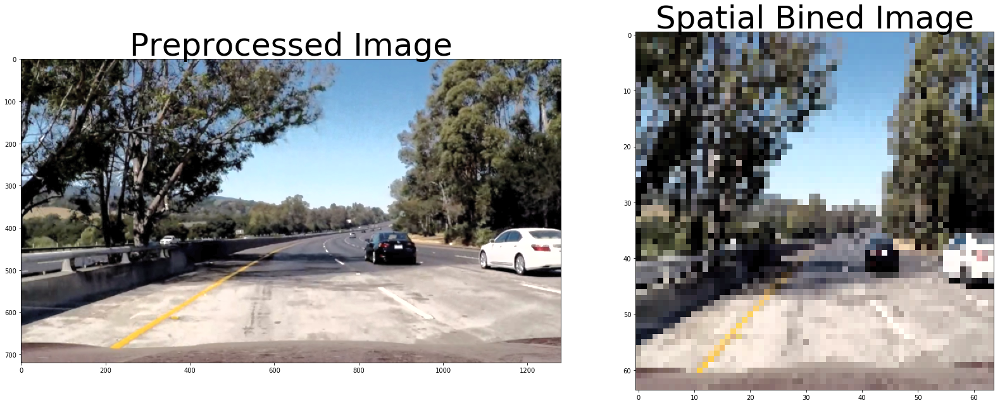

In [489]:
show_images([preproc_sample_img, cv2.resize(preproc_sample_img, (64, 64))],
           ['Preprocessed Image', 'Spatial Bined Image'], 2, 1, (24, 9))

In [490]:
def bin_spatial(img, size=(32, 32)):
    """
    Spatial Binning
    """
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

### Feature Extraction Pipeline

In [492]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for image in imgs:
        #image = image.astype(np.float32)/255
        
        file_features = []
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(convert_color(feature_image, 'YCrCb2HLS'), nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features


In [493]:
main_sample_feature = extract_features([preproc_sample_img])

print('Preprocessed Image Shape :', preproc_sample_img.shape)
print('Size of feature :', len(main_sample_feature[0]))

Preprocessed Image Shape : (720, 1280, 3)
Size of feature : 512604


## Creating Classifier

### Calculate Features
https://github.com/sumitbinnani/CarND-Vehicle-Detection/blob/master/Vehicle-Detection.ipynb
https://github.com/sumitbinnani/CarND-Vehicle-Detection/blob/master/Vehicle-Detection-Model-Training.ipynb
https://github.com/jeremy-shannon/CarND-Vehicle-Detection/blob/master/vehicle_detection_project.ipynb
https://github.com/sumitbinnani/CarND-Vehicle-Detection

In [590]:
color_space = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = False # Spatial features on or off
hist_feat = False # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [None, None] # Min and max in y to search in slide_window()


start_time = time.time()

# Calculate vehicle features
vehicle_features = extract_features(vehicle_imgs, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

# Calculate non vehicle features
non_vehicle_features = extract_features(non_vehicle_imgs, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)


end_time = time.time()
print(round(end_time - start_time, 2), 'Seconds to extract features...')

205.93 Seconds to extract features...


### Training

In [591]:
# Create an array stack of feature vectors
X = np.vstack((vehicle_features, non_vehicle_features)).astype(np.float64)

# Define the labels vector
y = np.hstack((np.ones(len(vehicle_features)), np.zeros(len(non_vehicle_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X, y = shuffle(X, y, random_state=rand_state)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rand_state)
    
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X_train)

# Apply the scaler to X
X_train = X_scaler.transform(X_train)
X_test = X_scaler.transform(X_test)

In [592]:
def performance_metric(y_true, y_predict):
    #return f1_score(y_true, y_predict, average='micro')
    return recall_score(y_true, y_predict, average='macro')


print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))


### Find best hyper parameters
n_items_for_parameter = 1000
scoring_fnc = make_scorer(performance_metric)

start_time = time.time()

## Support Vector Machine
#hyper_params = {'C': np.logspace(-3, 2, 10)}
#base_clf = LinearSVC()
#base_clf = SVC(kernel='rbf')
#cv_clf = GridSearchCV(estimator=base_clf, param_grid=hyper_params, scoring=scoring_fnc, n_jobs=1)
#cv_clf.fit(X_train[:n_items_for_parameter], y_train[:n_items_for_parameter])
#clf = cv_clf.best_estimator_
#print('Best hyperparameter C:', cv_clf.best_params_['C'])
#clf = LinearSVC(C=1.0)

## Random Forest
hyper_params = {'n_estimators': np.arange(10, 50, 10),
                'max_depth': np.arange(2, 8, 1),
                'min_samples_split': np.arange(2, 10, 2)}

base_clf = RandomForestClassifier(n_jobs=1, max_features='sqrt', oob_score=True) 
cv_clf = GridSearchCV(estimator=base_clf, param_grid=hyper_params, cv=5)
cv_clf.fit(X_train[:n_items_for_parameter], y_train[:n_items_for_parameter])
clf = cv_clf.best_estimator_
print('Best num estimators:', cv_clf.best_params_['n_estimators'])
print('Best max depth:', cv_clf.best_params_['max_depth'])
print('Best min samples split:', cv_clf.best_params_['min_samples_split'])

end_time = time.time()
print(round(end_time - start_time, 2), 'Seconds to find best parameters...')


### Training
start_time = time.time()
clf.fit(X_train, y_train)
end_time = time.time()
print(round(end_time - start_time, 2), 'Seconds to train classifier...')


# Check the score of the SVC
print('Test Accuracy of classifier = ', round(clf.score(X_test, y_test), 4))


# Check the prediction time for a single sample
start_time = time.time()
n_predict = 10
print('My classifier predicts:  ', clf.predict(X_test[0:n_predict]))
print('Expected results: ', y_test[0:n_predict])
end_time = time.time()
print(round(end_time - start_time, 5), 'Seconds to predict', n_predict,'labels with classifier')

Using: 9 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 5292
Best num estimators: 40
Best max depth: 7
Best min samples split: 4
257.54 Seconds to find best parameters...
25.56 Seconds to train classifier...
Test Accuracy of classifier =  0.9609
My classifier predicts:   [ 0.  0.  0.  1.  0.  1.  1.  1.  1.  0.]
Expected results:  [ 0.  0.  0.  1.  0.  1.  1.  0.  1.  0.]
0.01569 Seconds to predict 10 labels with classifier


## Define Pipeline

In [593]:
def find_cars(img, ystart, ystop, scale, clf, X_scaler, 
              orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, is_draw=False):
    candidate_points = []
    
    draw_img = None
    if is_draw:
        draw_img = np.copy(img)
    
    #img = img.astype(np.float32)/255
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YUV')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            #hist_features = color_hist(convert_color(subimg, 'YCrCb2HLS'), nbins=hist_bins)

            # Scale features and make a prediction
            #test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1)) 
            #test_features = X_scaler.transform(np.hstack((spatial_features, hog_features)).reshape(1, -1)) 
            #test_features = X_scaler.transform(np.hstack((hist_features, hog_features)).reshape(1, -1)) 
            test_features = X_scaler.transform(hog_features.reshape(1, -1)) 
            test_prediction = clf.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                p1 = (xbox_left, ytop_draw+ystart)
                p2 = (xbox_left+win_draw,ytop_draw+win_draw+ystart)
                candidate_points.append((p1, p2))
                
                if is_draw:
                    cv2.rectangle(draw_img, p1, p2, (0,0,255), 6)
                
    if is_draw:
        return candidate_points, draw_img
    else:
        return candidate_points

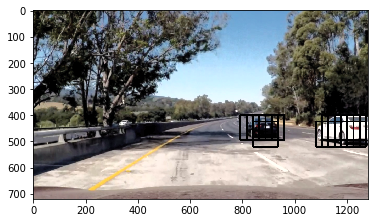

In [594]:
ystart = 400
ystop = 656
scale = 1.5

candidate_points, out_img = find_cars(preproc_sample_img, ystart, ystop, scale, clf, X_scaler, 
                    orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, True)

plt.imshow(out_img)

In [595]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

def remove_false_positives(img, candidate_points, threshold=1):
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    # Add heat to each box in box list
    heat = add_heat(heat, candidate_points)
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat, threshold)
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    return draw_labeled_bboxes(np.copy(img), labels), labels, heatmap

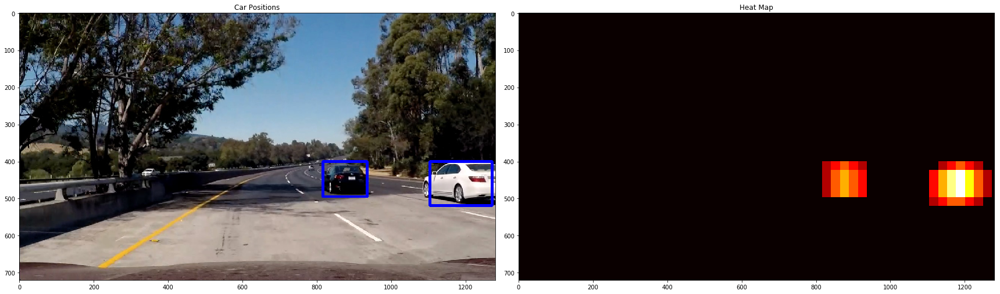

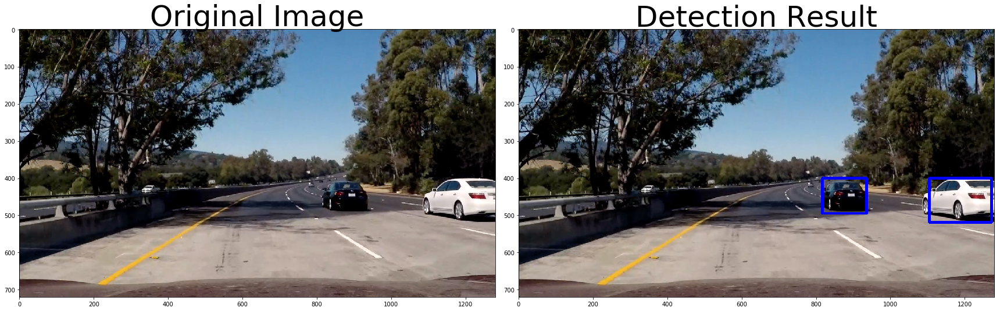

In [606]:
result_img, labels, heatmap = remove_false_positives(main_sample_img, candidate_points, 1)

fig = plt.figure(figsize=(24,9))
plt.subplot(121)
plt.imshow(result_img)
plt.title('Car Positions')
plt.subplot(122)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()
#plt.savefig('./output_images/heatmap.png')

show_images([main_sample_img, result_img], ['Original Image', 'Detection Result'], 
            2, 1, (24, 9), './output_images/pipeline.png')

In [608]:
class VehicleDetector:
    def __init__(self):
        # For imprioving robustness
        self.prev_labels = []
    
    def detect(self, img, ystart=[360,400,440], ystop=[560,600,700], scale=[1.5,1.8,2.5], 
               threshold=4, with_all_positives=False, is_return_heatmap=False): 
        ## 1. Preprocessing
        preproc_img = preprocess(img)
        #preproc_img = img
    
        ## 2. Find cars
        candidate_points = []
        for ystart, ystop, scale in zip(ystart, ystop, scale):
            candidate_points.extend(find_cars(preproc_img, ystart, ystop, scale, clf, X_scaler, 
                    orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))
        
        # Draw all positives
        if with_all_positives:
            positives_img = np.copy(img)
            for p in candidate_points:
                cv2.rectangle(positives_img, p[0], p[1], (0,0,255), 6)
        
        ## 3. Remove false positive
        result_img, labels, heatmap = remove_false_positives(img, candidate_points, threshold)
        
        ## 4. Compensation
        #if len(labels) == 0 and len(self.prev_labels) > 0:
        #    result_img = draw_labeled_bboxes(np.copy(img), labels)
        #self.prev_labels = labels
        
        if with_all_positives and is_return_heatmap:
            return result_img, positives_img, heatmap
        elif with_all_positives:
            return result_img, positives_img
        elif is_return_heatmap:
            return result_img, heatmap
        else:
            return result_img

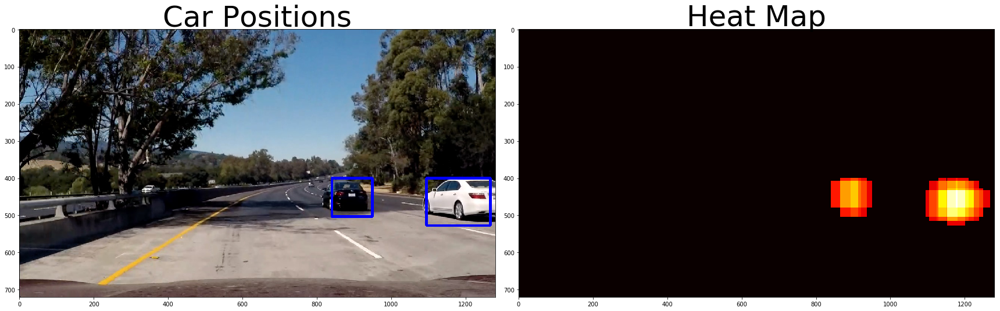

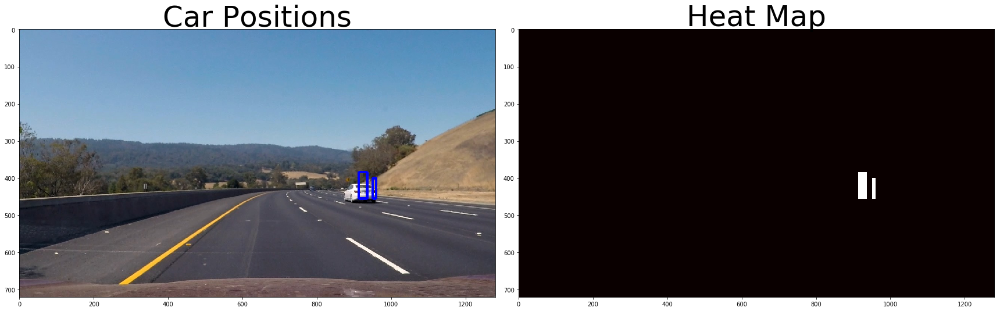

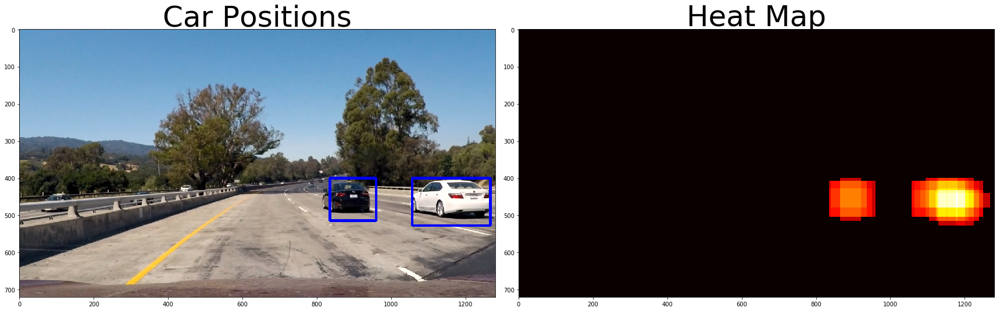

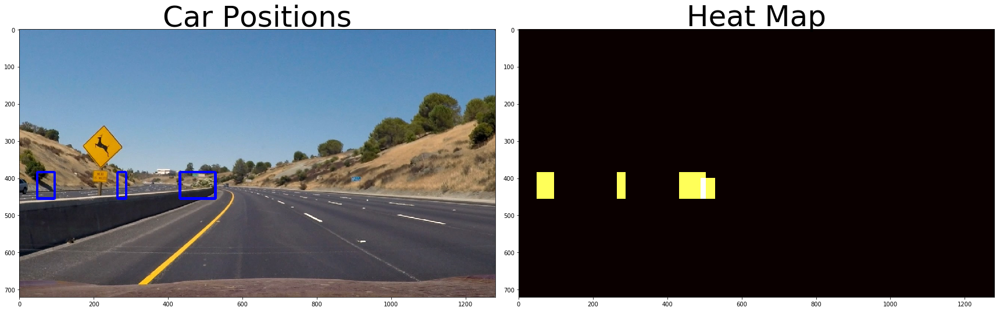

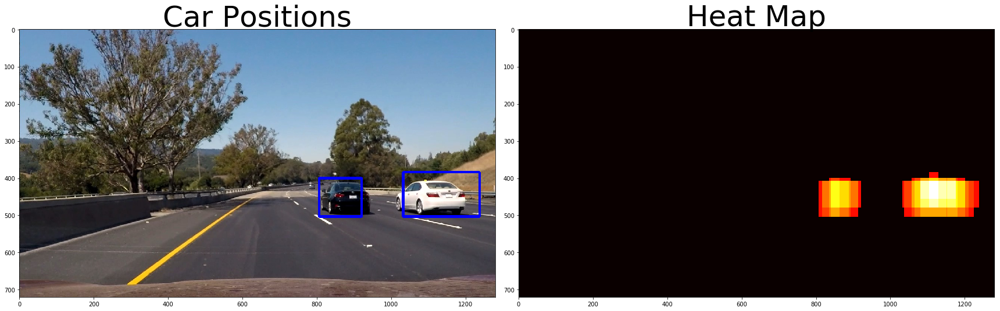

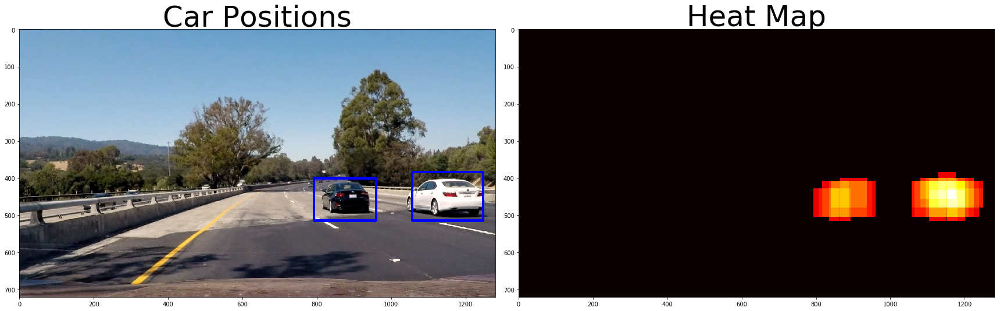

In [611]:
heatmap_output_imgs = []
heatmap_output_img_titles = []
for cnt, img in enumerate(sample_imgs):
    vehicle_detector = VehicleDetector()
    result_img, heatmap = vehicle_detector.detect(img, is_return_heatmap=True)
    
    # Output result
    fig = plt.figure(figsize=(24,9))
    plt.subplot(121)
    plt.imshow(result_img)
    plt.title('Car Positions', fontsize=50)
    plt.subplot(122)
    plt.imshow(heatmap, cmap='hot')
    plt.title('Heat Map', fontsize=50)
    fig.tight_layout()
    plt.savefig('./output_images/heatmap' + str(cnt) + '.png')

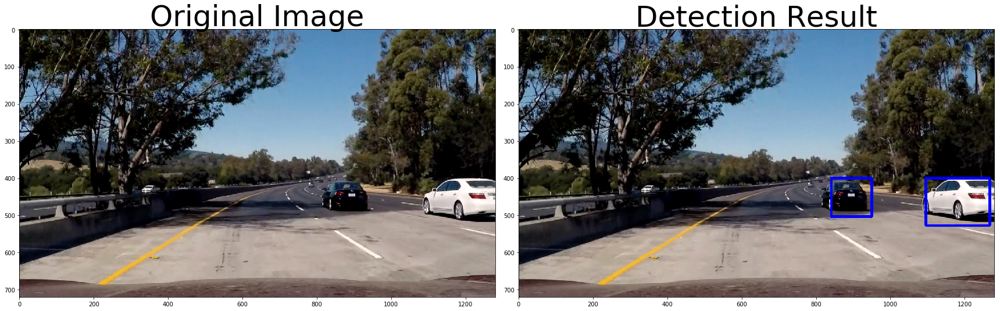

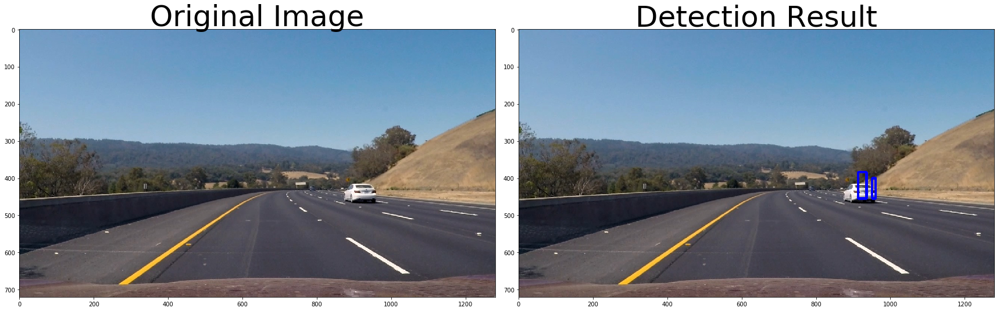

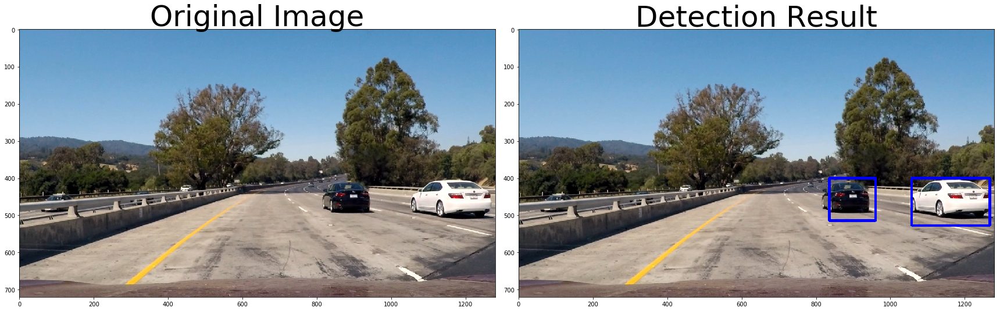

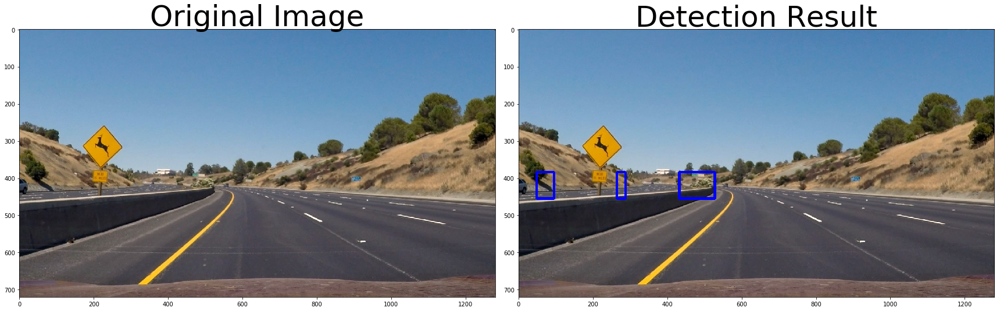

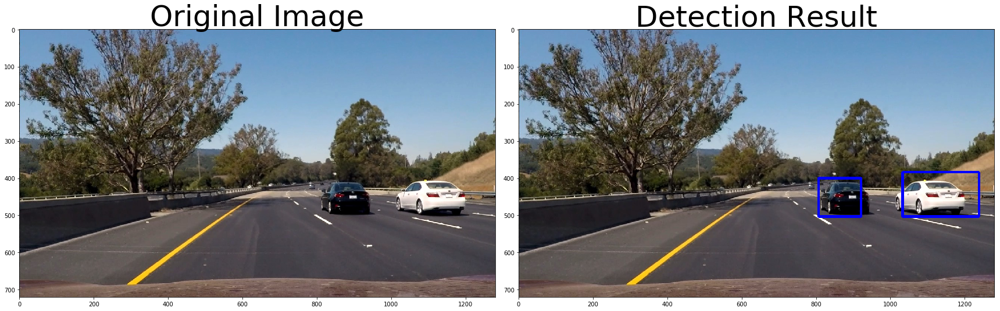

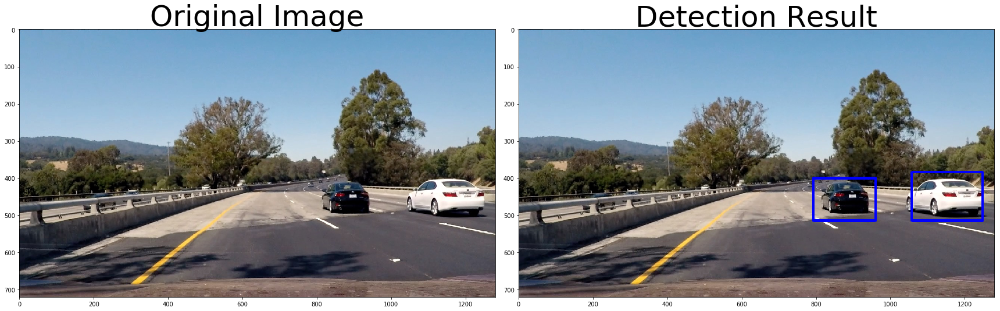

In [612]:
for cnt, img in enumerate(sample_imgs):
    vehicle_detector = VehicleDetector()
    result_img = vehicle_detector.detect(img, with_all_positives=False)
    
    # Output result
    show_images([img, result_img], ['Original Image', 'Detection Result'], 
                2, 1, (24, 9), './output_images/final' + str(cnt) + '.png')

## Apply My Pipeline to Video

In [332]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:
white_output = './output_images/project_video_result.mp4'
vehicle_detector = VehicleDetector()

## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
#clip1 = VideoFileClip("./test_images/project_video.mp4").subclip(20, 25)
#clip1 = VideoFileClip("./test_images/project_video.mp4").subclip(20, 30)
clip1 = VideoFileClip("./test_images/project_video.mp4")
white_clip = clip1.fl_image(vehicle_detector.detect)
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video ./output_images/project_video_result.mp4
[MoviePy] Writing video ./output_images/project_video_result.mp4



100%|█████████▉| 1260/1261 [1:22:25<00:04,  4.03s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_images/project_video_result.mp4 

CPU times: user 1h 24min 7s, sys: 1min 51s, total: 1h 25min 59s
Wall time: 1h 22min 26s


In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))